# Tarea Semanal 4


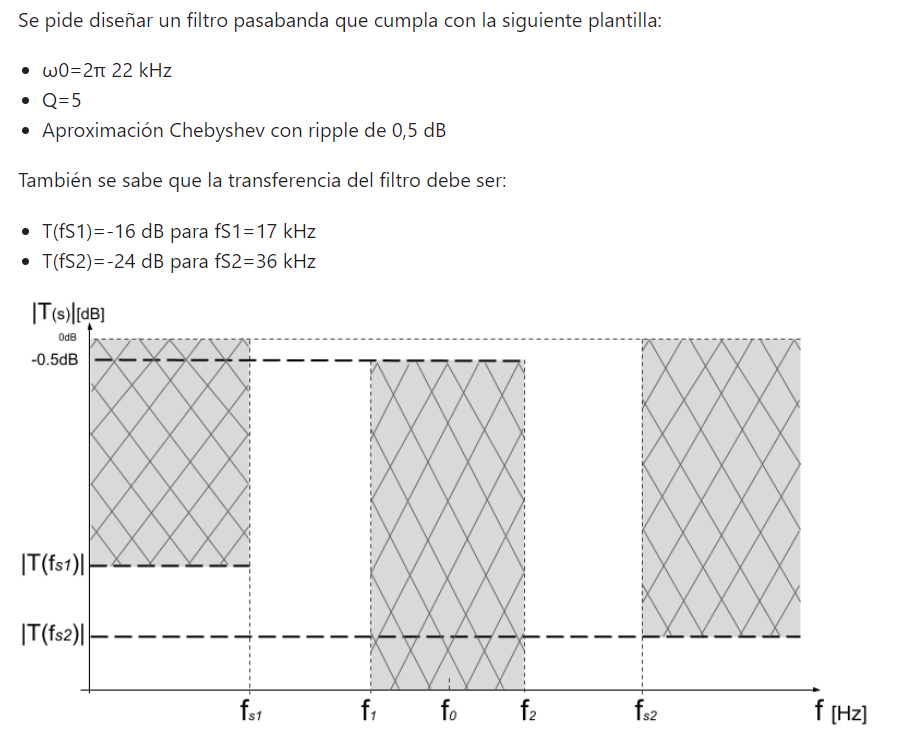

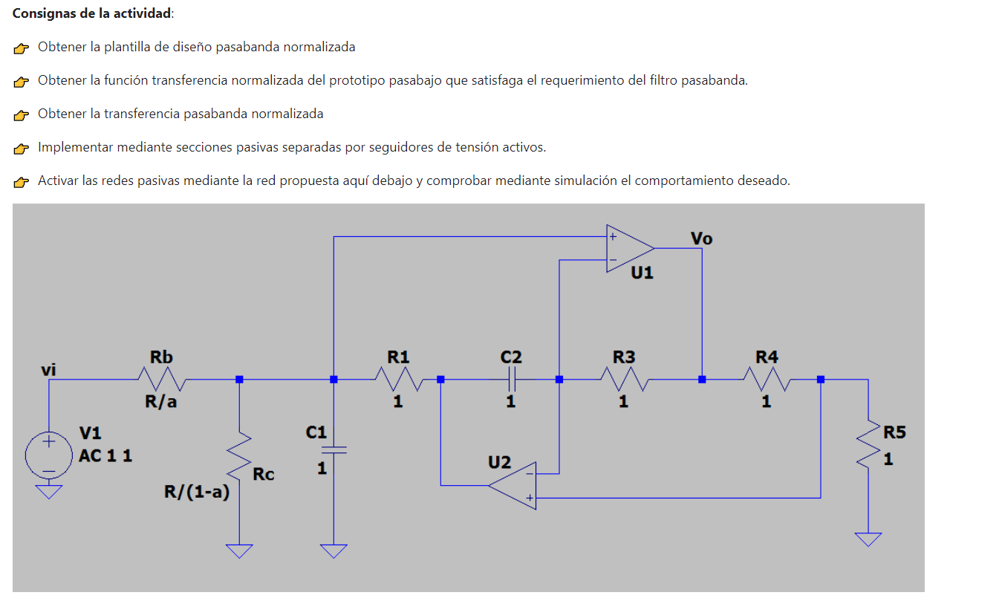

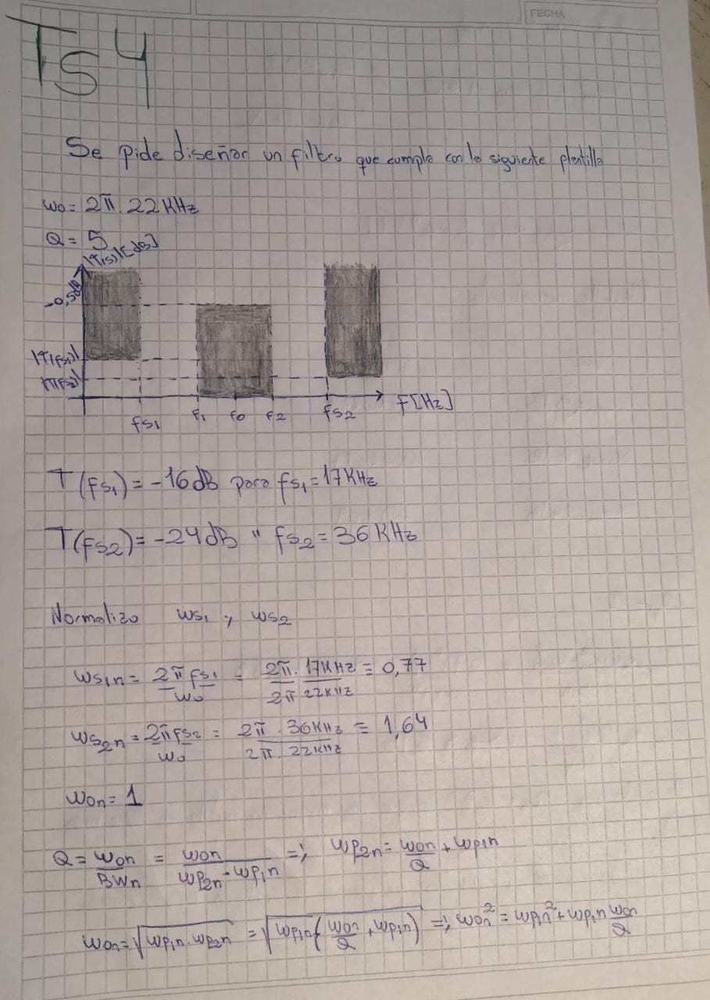

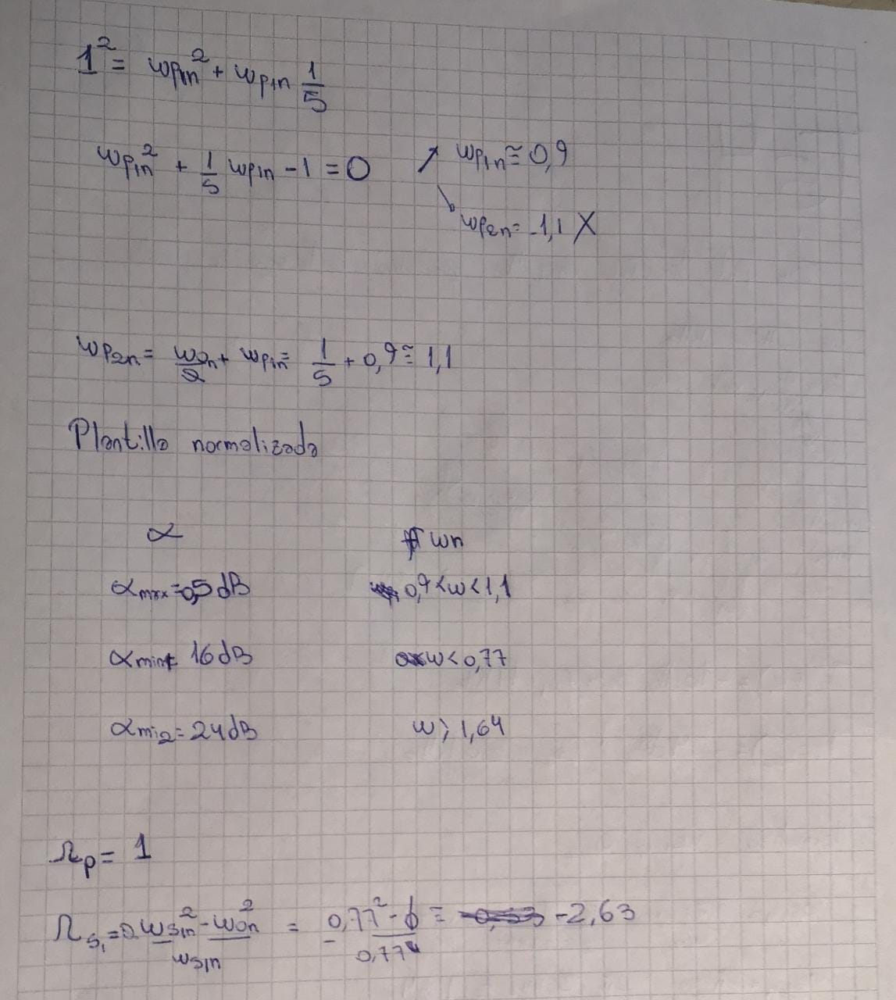

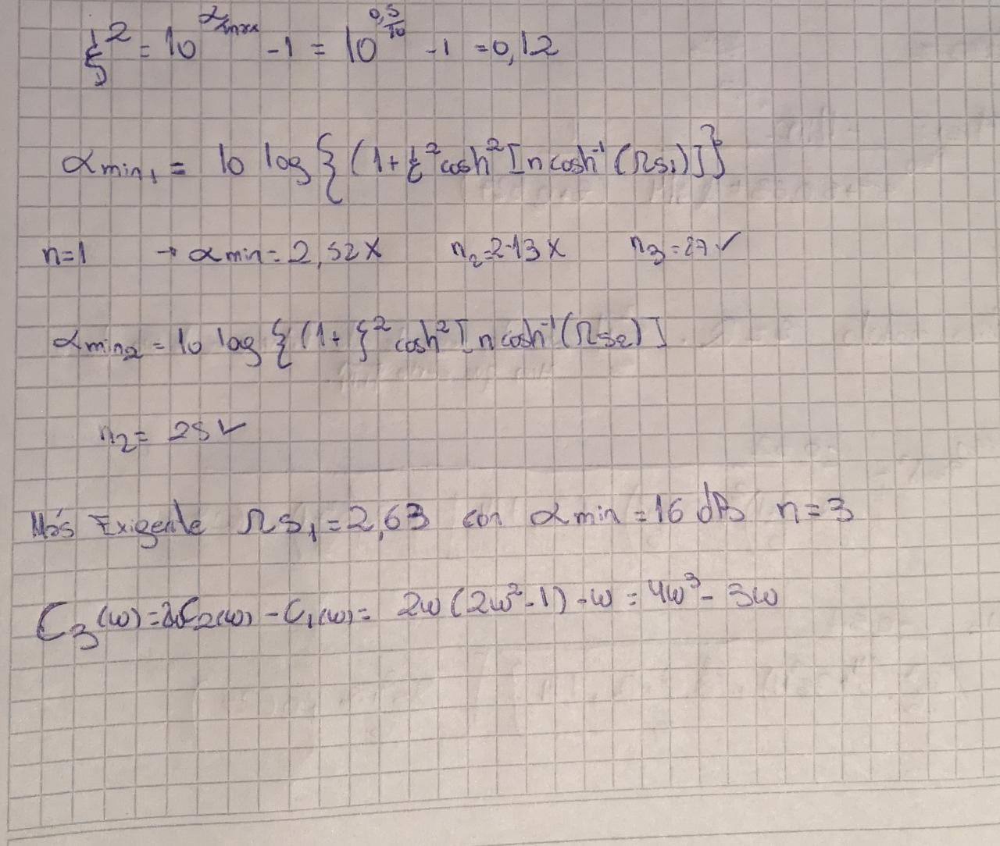

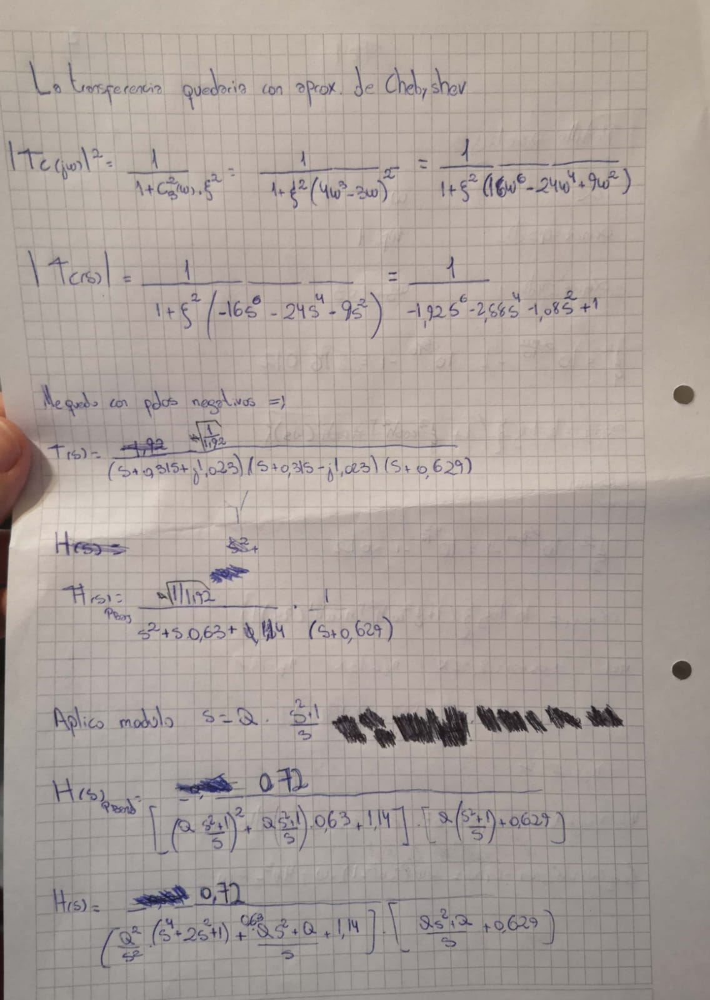

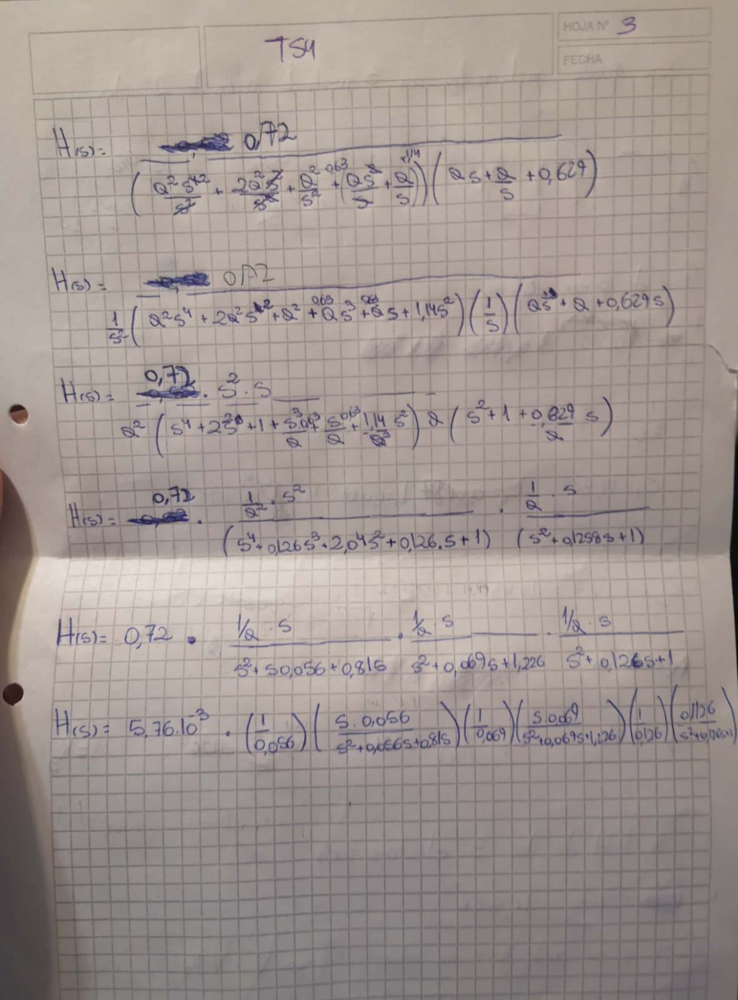


In [ ]:
import numpy as np

den = [ -1.92, 0, -2.88, 0, -1.08, 0,  1]
roots = np.roots(den)
print(f'roots: {roots}')

Con este codigo calcule los polos del chevyshev para armar luego T(s).

Realizamos la verificacion numerica

nn 2 - 17000.000000 [Hz]: 13.085276 dB - 36000.000000 [Hz]: 25.123400 dB 
nn 3 - 17000.000000 [Hz]: 26.866707 dB - 36000.000000 [Hz]: 45.242131 dB 
nn 4 - 17000.000000 [Hz]: 40.862115 dB - 36000.000000 [Hz]: 65.374774 dB 



----------------------------
* Elegimos de la iteración *
----------------------------
n 3 - 17000.000000 [Hz]: 26.866707 dB - 36000.000000 [Hz]: 45.242131 dB 



--------------------------------
Transferencia pasabajo prototipo
--------------------------------


<IPython.core.display.Math object>

<IPython.core.display.Math object>




--------------------------------
Transferencia pasabanda prototipo
--------------------------------


<IPython.core.display.Math object>




------------------
Particiono en SOSs
------------------


<IPython.core.display.Math object>




------------------------------------------------
Particiono en SOSs parametrizados como nos gusta
------------------------------------------------


<IPython.core.display.Math object>

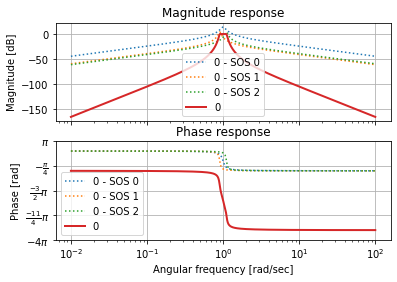

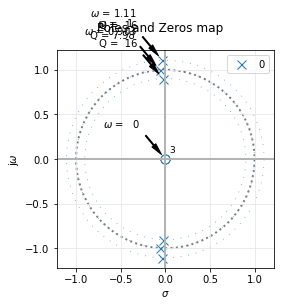

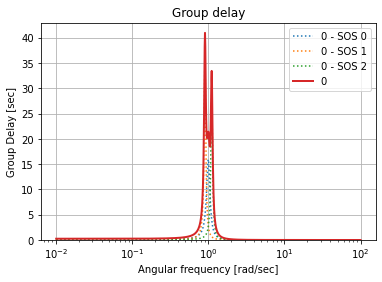

In [2]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
@author: pedro
"""

import numpy as np
import scipy.signal as sig
import splane as tc2
import matplotlib.pyplot as plt


# de la plantilla pasaaltos llegamos a la plantilla pasabajo
alfa_max = 0.5 # dB
fo = 22e3
f1 = 17e3
f2 = 36e3

wo_bp = fo * 2 * np.pi
Q_bp = 5
w1 = f1 * 2 * np.pi/wo_bp
w2 = f2 * 2 * np.pi/wo_bp
wo_bp = 1

# cuentas auxiliares

# epsilon cuadrado
ee = 10**(alfa_max/10)-1

Om1 = Q_bp * np.abs(w1**2-wo_bp**2)/w1
Om2 = Q_bp * np.abs(w2**2-wo_bp**2)/w2

for nn in range(2,5):
    alfa_min_w1 = 10*np.log10(1 + ee * np.cosh(nn * np.arccosh(Om1))**2 )
    alfa_min_w2 = 10*np.log10(1 + ee * np.cosh(nn * np.arccosh(Om2))**2 )
    print( 'nn {:d} - {:f} [Hz]: {:f} dB - {:f} [Hz]: {:f} dB '.format(nn, f1, alfa_min_w1, f2, alfa_min_w2) )
   

# elijo un orden luego de iterar ...
nn = 3
alfa_min_w1 = 10*np.log10(1 + ee * np.cosh(nn * np.arccosh(Om1))**2 )
alfa_min_w2 = 10*np.log10(1 + ee * np.cosh(nn * np.arccosh(Om2))**2 )
ee = 10**(alfa_max/10)-1

print('\n\n')
print('----------------------------')
print('* Elegimos de la iteración *')
print('----------------------------')

print( 'n {:d} - {:f} [Hz]: {:f} dB - {:f} [Hz]: {:f} dB '.format(nn, f1, alfa_min_w1, f2, alfa_min_w2) )

# verificación Cheby1
z,p,k = sig.cheb1ap(nn, alfa_max)
num_pb, den_pb = sig.zpk2tf(z,p,k)

print('\n\n')
print('--------------------------------')
print('Transferencia pasabajo prototipo')
print('--------------------------------')
tc2.pretty_print_lti(num_pb, den_pb)

# particiono en 2 SOS's para la implementación
sos_pb = tc2.tf2sos_analog(num_pb, den_pb)

# parametrizada
tc2.pretty_print_SOS(sos_pb, mode='omegayq')

# 
num_pbanda, den_pbanda = sig.lp2bp(num_pb, den_pb, bw = 1/Q_bp)

print('\n\n')
print('--------------------------------')
print('Transferencia pasabanda prototipo')
print('--------------------------------')
tc2.pretty_print_lti(num_pbanda, den_pbanda)

# particiono en 2 SOS's para la implementación
sos_pbanda = tc2.tf2sos_analog(num_pbanda, den_pbanda)

print('\n\n')
print('------------------')
print('Particiono en SOSs')
print('------------------')

# la visualizamos de algunas formas, la tradicional
tc2.pretty_print_SOS(sos_pbanda)

print('\n\n')
print('------------------------------------------------')
print('Particiono en SOSs parametrizados como nos gusta')
print('------------------------------------------------')

# o parametrizada
tc2.pretty_print_SOS(sos_pbanda, mode='omegayq')

plt.close('all')

tc2.analyze_sys( sos_pbanda )

Ahora realizaremos la implementacion circuital pasiva

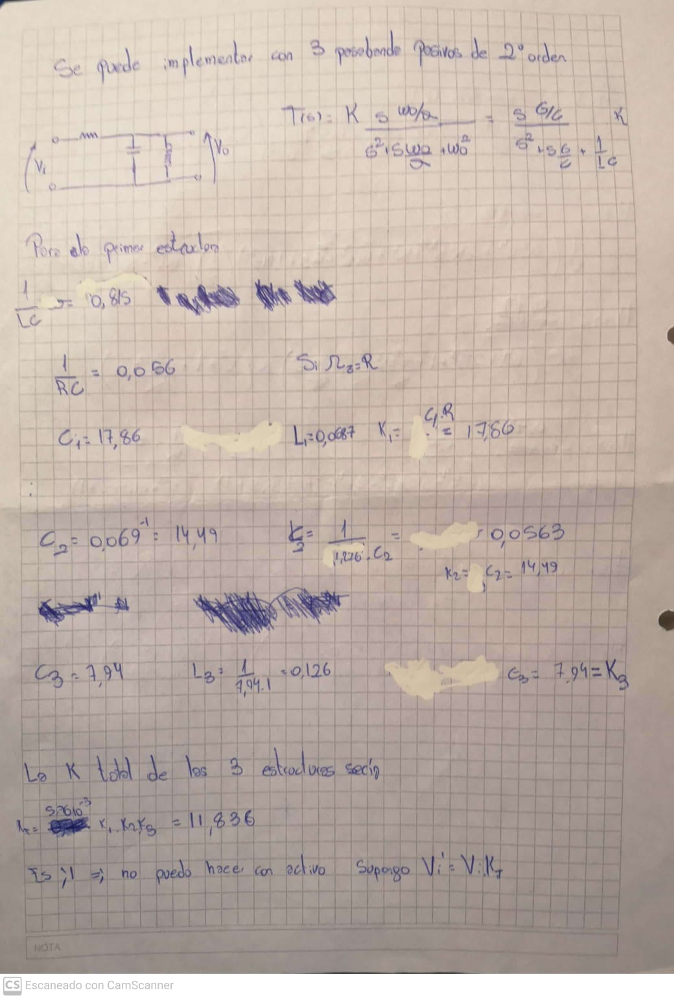

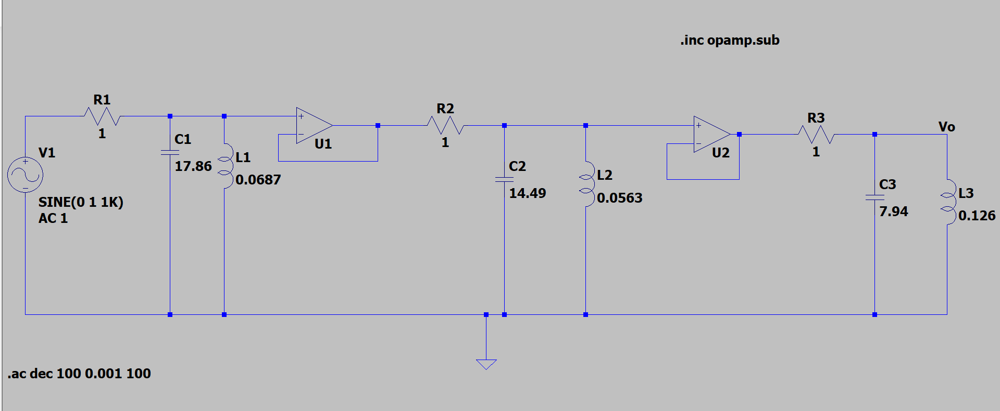

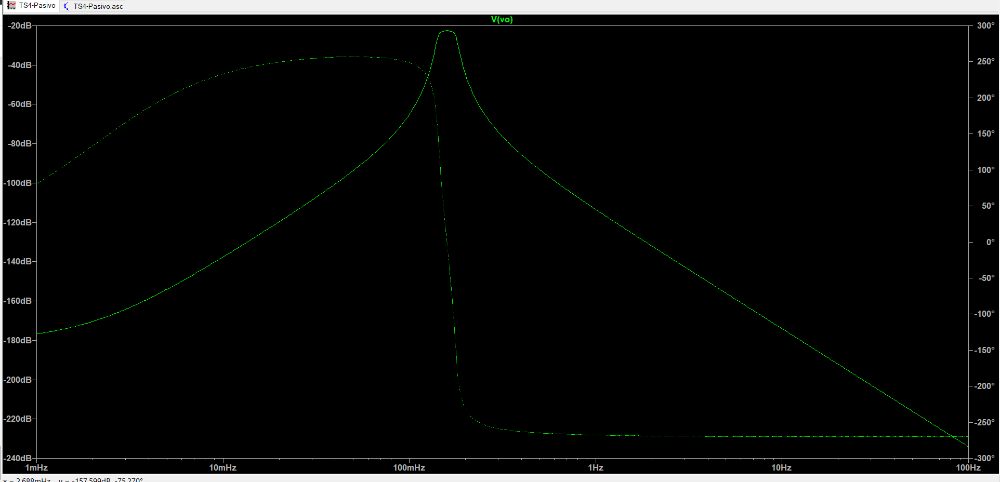

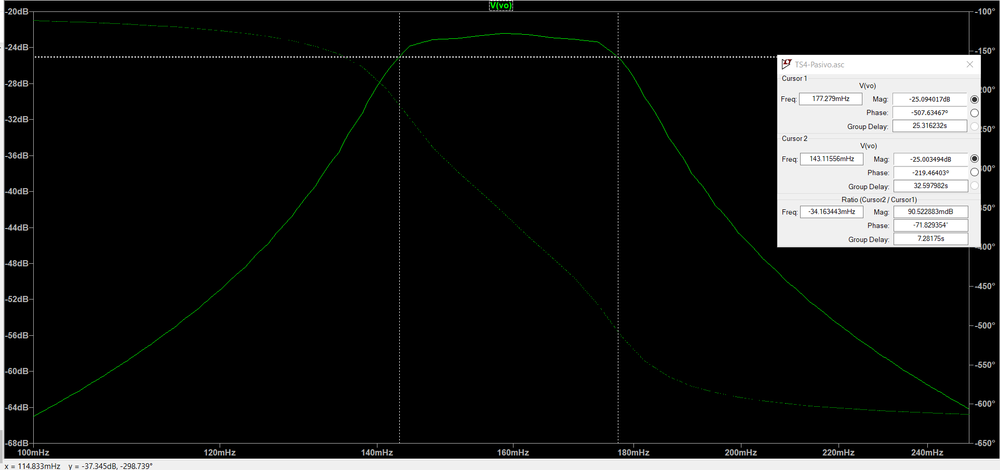

Por ultimo realizamos la implementacion activa

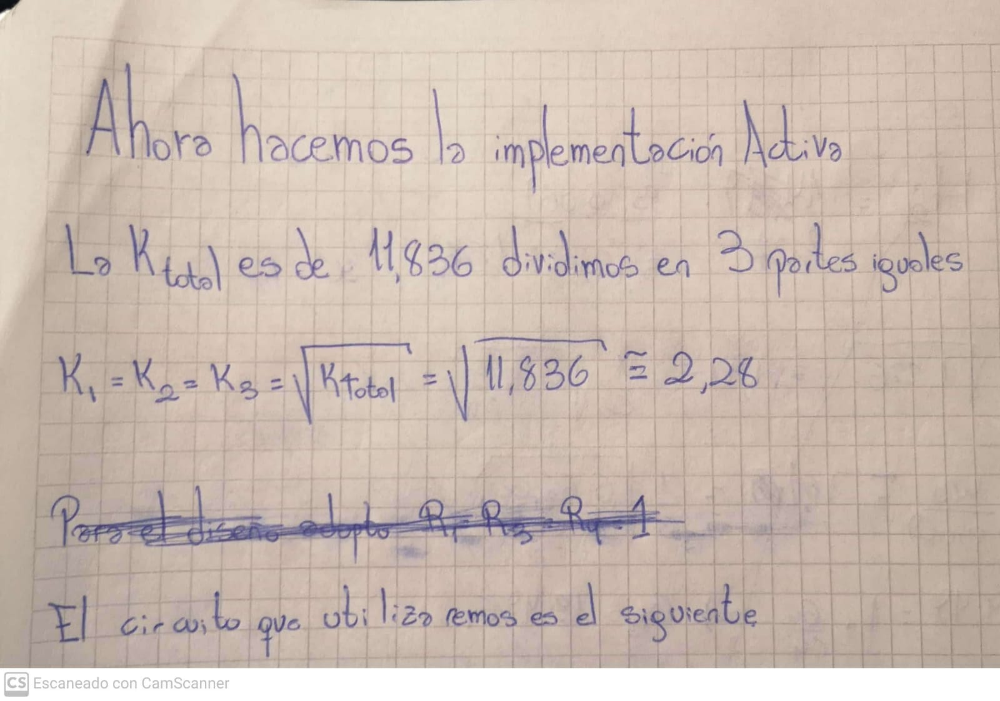

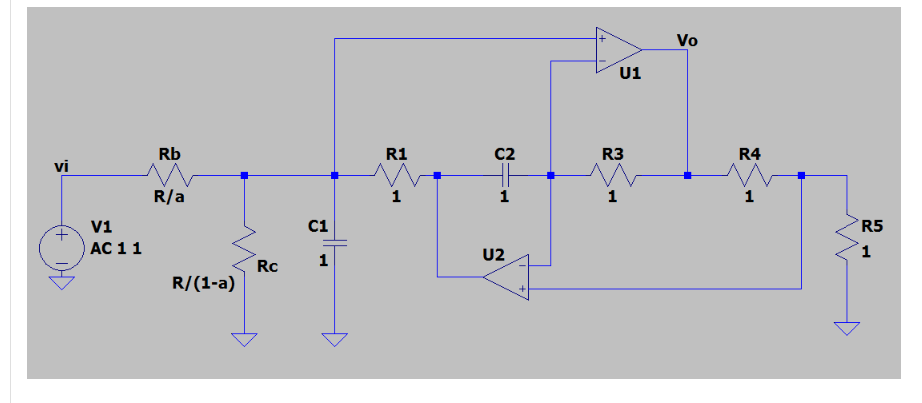

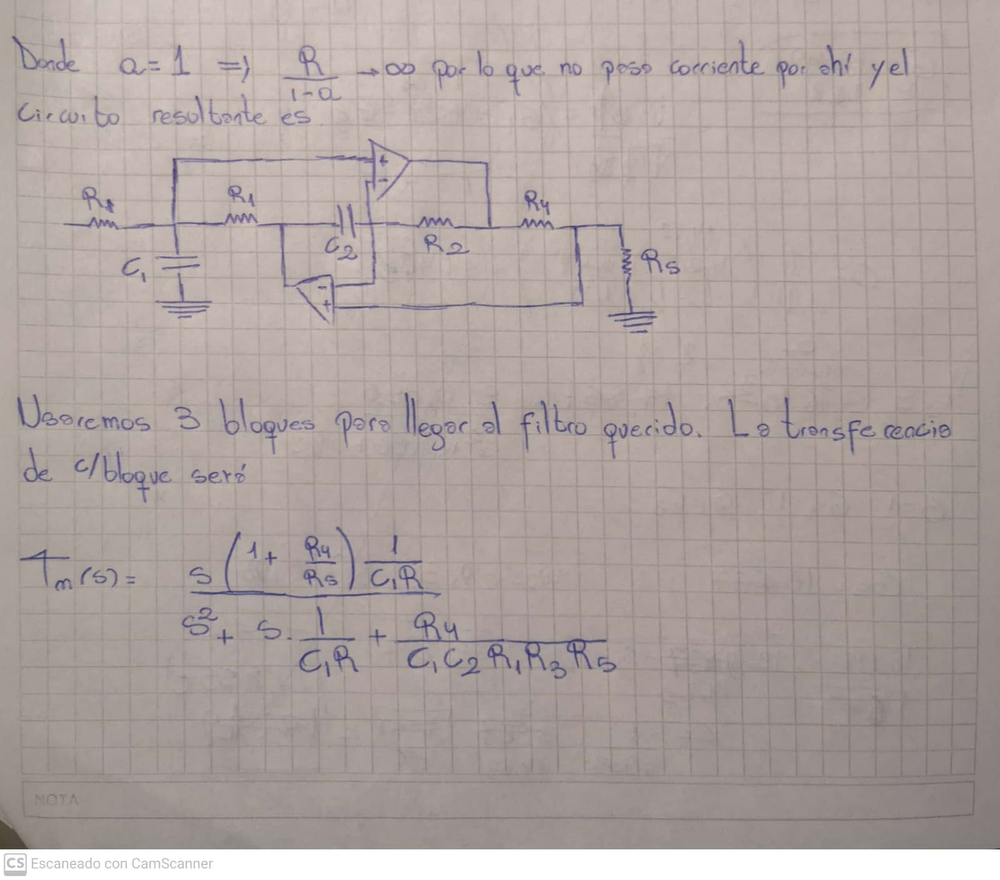

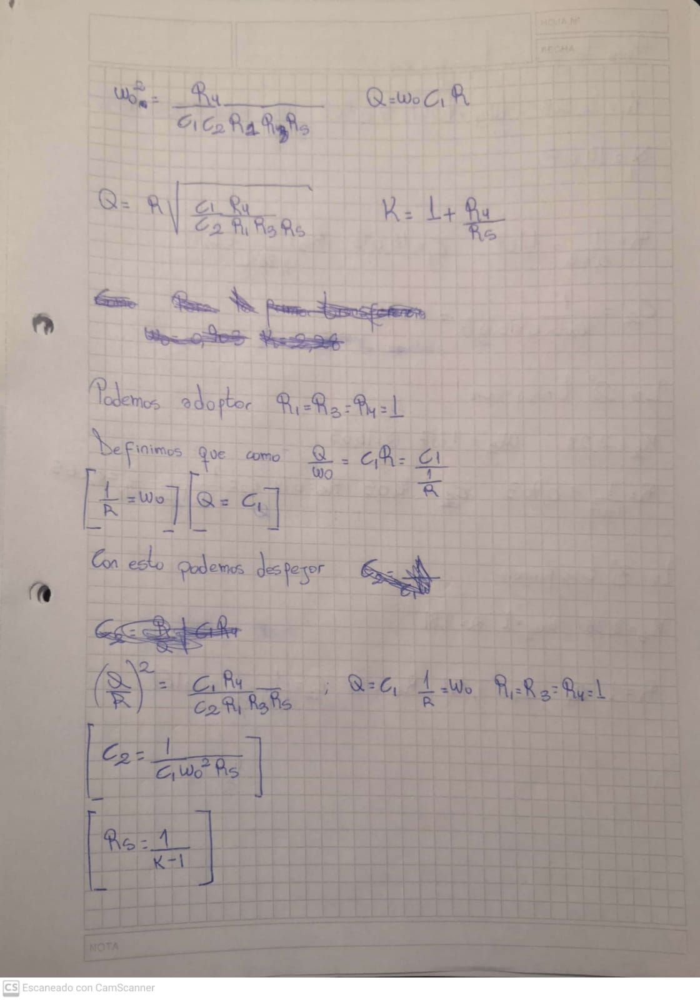

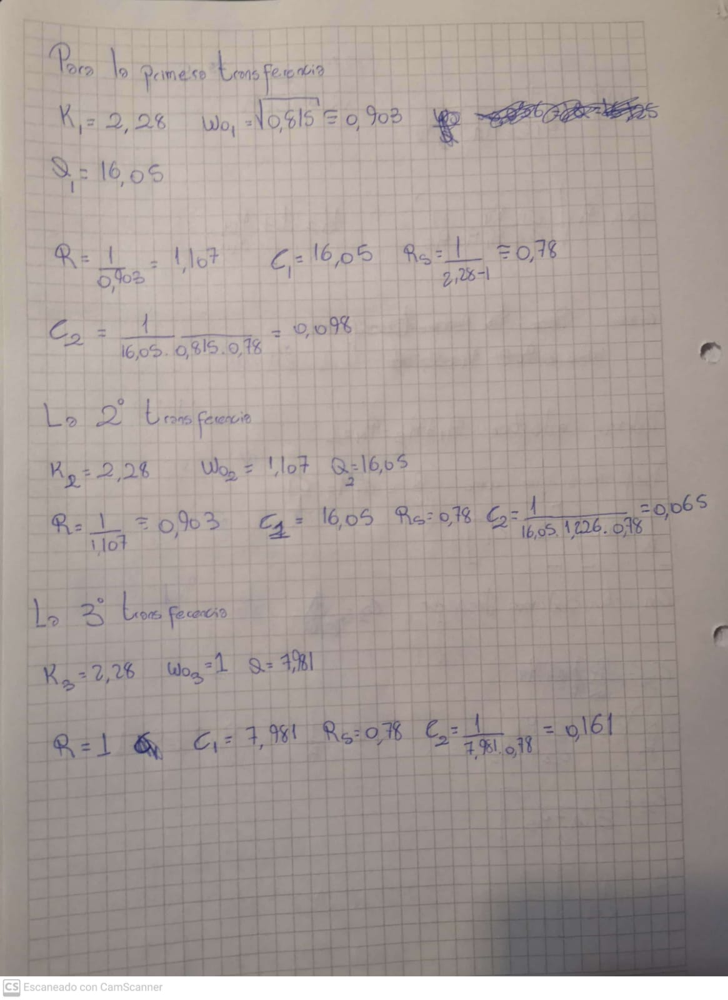

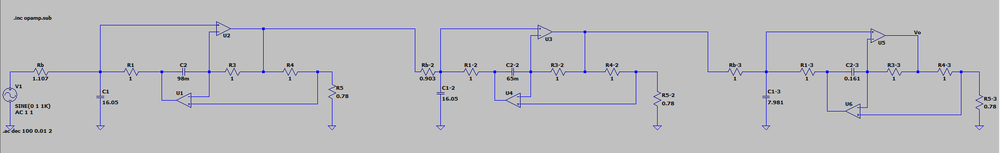

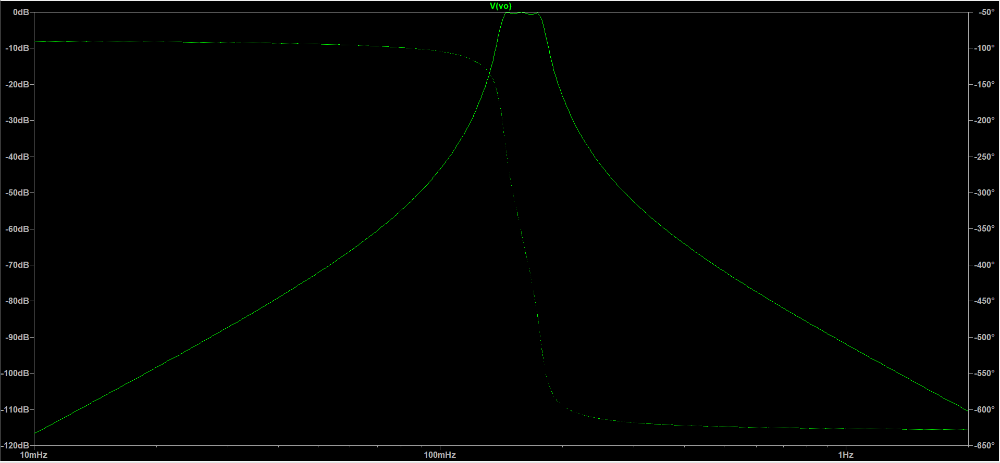

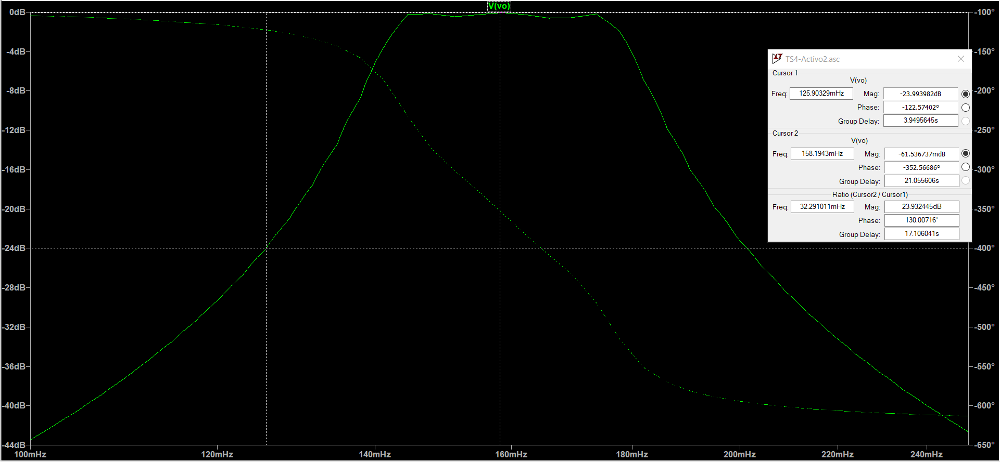